In [1]:
import torch
from torch.nn import ConvTranspose2d
from torch.nn import BatchNorm2d
from torch.nn import Conv2d
from torch.nn import Linear
from torch.nn import LeakyReLU
from torch.nn import ReLU
from torch.nn import Tanh
from torch.nn import Sigmoid
from torch.optim import Adam
from torch.nn import BCELoss
from torch import flatten
from torch import nn
from torch.nn.functional import pad
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
import matplotlib.pyplot as plt
from imutils import build_montages
import cv2
import numpy as np
import pandas as pd
import xarray as xr
import math
import os
import cartopy.crs as ccrs
import cartopy.mpl.ticker as cticker
import cartopy.feature as cfeature 
import matplotlib.colors as colors
import time
import warnings
warnings.filterwarnings('ignore')

In [2]:
print(f'Is CUDA supported by this system? {torch.cuda.is_available()}')
print(f'CUDA version: {torch.version.cuda}')
 
# Storing ID of current CUDA device
cuda_id = torch.cuda.current_device()
print(f'ID of current CUDA device: {torch.cuda.current_device()}')
       
print(f'Name of current CUDA device: {torch.cuda.get_device_name(cuda_id)}')
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(DEVICE)

Is CUDA supported by this system? True
CUDA version: 12.1
ID of current CUDA device: 0
Name of current CUDA device: NVIDIA GeForce RTX 4070 Ti
cuda:0


In [3]:
lat1=17.5;lat2=60
lon1=230;lon2=302.5
lev0=500
iyr1=1979;iyr2=2020
nyr=iyr2-iyr1+1

dir='./data/hgt.'

In [4]:
"""
Read daily H500 during Dec-Feb from 1979-2020. 
Note that the latitude dimension is reversed!
"""
hgt = None
for iyr in range(iyr1,iyr2+1):
    #read Dec in Year(0) into hgt0
    df = xr.open_dataset(dir+str(iyr)+'.nc')['hgt'].sel(lat=slice(lat2,lat1),lon=slice(lon1,lon2),level=lev0).squeeze()
    hgt0 = df.where(df['time.month'] == 12,drop=True)
    
    #read Jan and Feb in Year(+1) into hgt1
    df = xr.open_dataset(dir+str(iyr+1)+'.nc')['hgt'].sel(lat=slice(lat2,lat1),lon=slice(lon1,lon2),level=lev0).squeeze()
    hgt1 = df.where(df['time.month'] <= 2,drop=True)
    
    #concatenate Dec data and Jan-Feb data. hgt01 is of the shape [nyr, ndy, nlat, nlon]
    hgt01 = xr.concat([hgt0,hgt1],dim='time')
    hgt01 = hgt01.rolling({'time':5}, center=True, min_periods=1).mean()
    hgt01 = hgt01.where((hgt01['time.month']!=2) | ((hgt01['time.month']==2) & (hgt01['time.day']!=29)),drop=True)
    hgt01 = hgt01.assign_coords({"year": iyr})
    hgt01 = hgt01.assign_coords(time=((hgt01["time"] - hgt01["time"].min())/ np.timedelta64(1, 'D')))
    
    if type(hgt) != type(hgt01):
        hgt = hgt01
    else:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            hgt = xr.concat([hgt, hgt01], dim="year")

hgt = hgt - hgt.rolling(year=83, min_periods=1, center=True).mean()
trend = hgt.polyfit(dim='year', deg=1)
hgt = hgt - trend.polyfit_coefficients.sel(degree=1) * xr.ones_like(hgt['year'])
print('Finish reading H500')
print(hgt)
mu = hgt.mean().values
minv = hgt.min().values
maxv = hgt.max().values
vrange = maxv - minv
hgt = 2 * (hgt - minv) / vrange - 1
#print(hgt.min(), hgt.max())
print(hgt.time.values)

Finish reading H500
<xarray.DataArray (year: 42, time: 90, lat: 18, lon: 30)>
array([[[[-3.29248822e+01, -3.50747276e+01, -3.53978294e+01, ...,
          -1.56597666e+02, -1.87966299e+02, -2.15834276e+02],
         [-3.68145584e+01, -3.41304712e+01, -3.15027845e+01, ...,
          -1.19131301e+02, -1.48595405e+02, -1.77320602e+02],
         [-4.78436245e+01, -3.98605752e+01, -3.25640551e+01, ...,
          -9.58607901e+01, -1.22502866e+02, -1.48857964e+02],
         ...,
         [ 2.87010440e+01,  2.84521593e+01,  2.70785937e+01, ...,
           4.94828521e+01,  5.30190016e+01,  5.64333336e+01],
         [ 1.71155552e+01,  1.68520570e+01,  1.49806260e+01, ...,
           3.70985182e+01,  3.88432983e+01,  4.06240985e+01],
         [ 7.30640173e+00,  7.64467974e+00,  5.95767590e+00, ...,
           2.37074300e+01,  2.36378687e+01,  2.48452973e+01]],

        [[-4.20167190e+01, -4.40799064e+01, -4.44603027e+01, ...,
          -1.59898605e+02, -1.85441519e+02, -2.08964966e+02],
         [

In [5]:
hgt.values.shape

(42, 90, 18, 30)

In [6]:
input_images = []
for i in range(hgt.values.shape[0]): # Years
    for j in range(hgt.values.shape[1]): # Days
        input_images.append(pad(torch.from_numpy(np.array(hgt.values[i,j,:])).float(),(1,1,7,7)))#.to('cuda:0'))
input_images = np.expand_dims(input_images, axis=1)

In [7]:
# Define the WGAN parameters
img_width = 32
img_height = 32
channels = 1
img_shape = (channels, img_height, img_width)
latent_dim = 128
critic_iterations = 5
clip_value = 0.01

In [8]:
# Define the generator model
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
		# first set of CONVT => RELU => BN
        self.ct1 = ConvTranspose2d(in_channels=latent_dim,
			out_channels=128, kernel_size=4, stride=2, padding=0,
			bias=False)
        self.relu1 = ReLU()
        self.batchNorm1 = BatchNorm2d(128)
		# second set of CONVT => RELU => BN
        self.ct2 = ConvTranspose2d(in_channels=128, out_channels=64,
					kernel_size=4, stride=2, padding=1, bias=False)
        self.relu2 = ReLU()
        self.batchNorm2 = BatchNorm2d(64)
		# last set of CONVT => RELU => BN
        self.ct3 = ConvTranspose2d(in_channels=64, out_channels=32,
					kernel_size=4, stride=2, padding=1, bias=False)
        self.relu3 = ReLU()
        self.batchNorm3 = BatchNorm2d(32)
		# apply another upsample and transposed convolution, but
		# this time output the TANH activation
        self.ct4 = ConvTranspose2d(in_channels=32,
			out_channels=channels, kernel_size=4, stride=2,
			padding=1, bias=False)
        self.tanh = Tanh()
        
    def forward(self, x):
        '''
        z = z.to('cuda:0')
        img = self.model(z)
        img = img.view(img.size(0), channels, img_height, img_width)
        return img
        '''
        # pass the input through our first set of CONVT => RELU => BN
		# layers
        x = self.ct1(x)
        x = self.relu1(x)
        x = self.batchNorm1(x)
        
		# pass the output from previous layer through our second
		# CONVT => RELU => BN layer set
        x = self.ct2(x)
        x = self.relu2(x)
        x = self.batchNorm2(x)
        
		# pass the output from previous layer through our last set
		# of CONVT => RELU => BN layers
        x = self.ct3(x)
        x = self.relu3(x)
        x = self.batchNorm3(x)
        
		# pass the output from previous layer through CONVT2D => TANH
		# layers to get our output
        x = self.ct4(x)
        output = self.tanh(x)
        
		# return the output
        return output

# Define the critic (discriminator) model
class Critic(nn.Module):
    def __init__(self, alpha=0.2):
        super(Critic, self).__init__()
        '''
        self.model = nn.Sequential(
            nn.Flatten(),
            nn.Linear(1 * img_width * img_height, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 128),
            nn.LeakyReLU(0.2),
            nn.Linear(128, 1)
        )
        '''
        # first set of CONV => RELU layers
        self.conv1 = Conv2d(in_channels=1, out_channels=32,
				kernel_size=4, stride=2, padding=1)
        self.leakyRelu1 = LeakyReLU(alpha, inplace=True)
		# second set of CONV => RELU layers
        self.conv2 = Conv2d(in_channels=32, out_channels=64, kernel_size=4,
				stride=2, padding=1)
        self.leakyRelu2 = LeakyReLU(alpha, inplace=True)
		# first (and only) set of FC => RELU layers
        self.fc1 = Linear(in_features=4096, out_features=512)
        self.leakyRelu3 = LeakyReLU(alpha, inplace=True)
		# sigmoid layer outputting a single value
        self.fc2 = Linear(in_features=512, out_features=1)
        self.sigmoid = Sigmoid()

    def forward(self, x):
        '''
        img_flat = img.view(img.size(0), -1)
        validity = self.model(img_flat)
        return validity
        '''
        # pass the input through first set of CONV => RELU layers
        x = self.conv1(x)
        x = self.leakyRelu1(x)
        
		# pass the output from the previous layer through our second
		# set of CONV => RELU layers
        x = self.conv2(x)
        x = self.leakyRelu2(x)
        
		# flatten the output from the previous layer and pass it
		# through our first (and only) set of FC => RELU layers
        x = flatten(x, 1)
        x = self.fc1(x)
        x = self.leakyRelu3(x)
        
		# pass the output from the previous layer through our sigmoid
		# layer outputting a single value
        x = self.fc2(x)
        output = self.sigmoid(x)
        
		# return the output
        return output

# Initialize weights of the models
def weights_init(model):
	# get the class name
	classname = model.__class__.__name__
	# check if the classname contains the word "conv"
	if classname.find("Conv") != -1:
		# intialize the weights from normal distribution
		nn.init.normal_(model.weight.data, 0.0, 0.02)
	# otherwise, check if the name contains the word "BatcnNorm"
	elif classname.find("BatchNorm") != -1:
		# intialize the weights from normal distribution and set the
		# bias to 0
		nn.init.normal_(model.weight.data, 1.0, 0.02)
		nn.init.constant_(model.bias.data, 0)

# Build the generator and critic
gen = Generator()
disc = Critic()
gen.apply(weights_init)
disc.apply(weights_init)
gen = gen.to(DEVICE)
disc = disc.to(DEVICE)

In [9]:
class Z500_Dataset(Dataset):
    def __init__(self, z):
        self.z = z
        
    def __len__(self):
        return len(self.z)
    
    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        sample = self.z[idx]
        return sample

dataset = Z500_Dataset(input_images)

#pin_memory = True
#pin_memory_device = 'cuda:0'
BATCH_SIZE = 64  
shuffle = True  
num_workers = 1  
#dataloader = DataLoader(dataset,
#        batch_size=batch_size,
#        shuffle=True,
#        num_workers=num_workers,
#        pin_memory=pin_memory,
#        pin_memory_device=pin_memory_device,
#)

dataloader = DataLoader(dataset, shuffle=True,
	batch_size=BATCH_SIZE)

In [10]:
def toXArray(imgs, lat, lon):
    n = np.array(range(imgs.shape[0]))
    asxr = xr.DataArray(
        data = imgs.squeeze(),
        dims=["n", "lat", "lon"],
        coords=[n,lat,lon],
        attrs=dict(
            description="z500",
            units="meters",
        )
    )
    return asxr

In [11]:
proj=ccrs.PlateCarree()
data_crs = ccrs.PlateCarree()

def my_plot(data, title, proj, data_crs, cbarlabel, fn, showit):
    x, y =  np.meshgrid(data['lon'], data['lat'])
    fig, ax = plt.subplots(24, 10, figsize=(35,50),subplot_kw=dict(projection=proj))
    #ax.set_title(title)
    for i in range(24):
        for j in range(10):
            n = i * 5 + j
            c = ax[i,j].contourf(x,y,data.sel(n=n),transform=data_crs,cmap ="jet",levels=300)
            #cb = fig.colorbar(c, shrink=0.4)
            #cb.set_label(cbarlabel)
            ax[i,j].coastlines()
            ax[i,j].add_feature(cfeature.STATES)
            gl = ax[i,j].gridlines(draw_labels=True)
            gl.top_labels = False
            gl.right_labels = False
    if fn:
        plt.savefig(fn)
    if showit:
        plt.show()

In [12]:
# Training parameters
NUM_EPOCHS = 1000
report_interval = 100

# calculate steps per epoch
stepsPerEpoch = len(dataloader.dataset) // NUM_EPOCHS

# initialize optimizer for both generator and discriminator
genOpt = Adam(gen.parameters(), lr=0.0002, betas=(0.5, 0.999),
	weight_decay=0.0002 / NUM_EPOCHS)
discOpt = Adam(disc.parameters(), lr=0.0002, betas=(0.5, 0.999),
	weight_decay=0.0002 / NUM_EPOCHS)
# initialize BCELoss function
criterion = BCELoss()


# randomly generate some benchmark noise so we can consistently
# visualize how the generative modeling is learning
print("[INFO] starting training...")
benchmarkNoise = torch.randn(256, latent_dim, 1, 1, device=DEVICE)
# define real and fake label values
realLabel = 1
fakeLabel = 0
# loop over the epochs
for epoch in range(NUM_EPOCHS):
	# show epoch information and compute the number of batches per
	# epoch
	print("[INFO] starting epoch {} of {}...".format(epoch + 1,
		NUM_EPOCHS))
    
	# initialize current epoch loss for generator and discriminator
	epochLossG = 0
	epochLossD = 0
	for x in dataloader:
		# zero out the discriminator gradients
		disc.zero_grad()
        
		# grab the images and send them to the device
		images = x#[0]
		images = images.to(DEVICE)
        
		# get the batch size and create a labels tensor
		bs =  images.size(0)
		labels = torch.full((bs,), realLabel, dtype=torch.float,
			device=DEVICE)
        
		# forward pass through discriminator
		output = disc(images).view(-1)
        
		# calculate the loss on all-real batch
		errorReal = criterion(output, labels)
        
		# calculate gradients by performing a backward pass
		errorReal.backward()
        
		# randomly generate noise for the generator to predict on
		noise = torch.randn(bs, latent_dim, 1, 1, device=DEVICE)
        
		# generate a fake image batch using the generator
		fake = gen(noise)
		labels.fill_(fakeLabel)
        
		# perform a forward pass through discriminator using fake
		# batch data
		output = disc(fake.detach()).view(-1)
		errorFake = criterion(output, labels)
        
		# calculate gradients by performing a backward pass
		errorFake.backward()
        
		# compute the error for discriminator and update it
		errorD = errorReal + errorFake
		discOpt.step()

		# set all generator gradients to zero
		gen.zero_grad()
        
		# update the labels as fake labels are real for the generator
		# and perform a forward pass  of fake data batch through the
		# discriminator
		labels.fill_(realLabel)
		output = disc(fake).view(-1)
        
		# calculate generator's loss based on output from
		# discriminator and calculate gradients for generator
		errorG = criterion(output, labels)
		errorG.backward()
        
		# update the generator
		genOpt.step()
        
		# add the current iteration loss of discriminator and
		# generator
		epochLossD += errorD
		epochLossG += errorG

	# display training information to disk
	print("[INFO] Generator Loss: {:.4f}, Discriminator Loss: {:.4f}".format(
		epochLossG / stepsPerEpoch, epochLossD / stepsPerEpoch))
	# check to see if we should visualize the output of the
	# generator model on our benchmark data
	if (epoch + 1) % 2 == 0:
        # set the generator in evaluation phase, make predictions on
        # the benchmark noise and generate the montage
		gen.eval()
		#p = os.path.join('./output/', "epoch_{}.png".format(str(epoch + 1).zfill(4)))
		#fake_images = toXArray(gen(benchmarkNoise).detach().cpu().squeeze()[:,7:-7,1:-1], hgt.lat, hgt.lon)
		#my_plot(fake_images, '', proj, data_crs, '', p, False)
    
        # set the generator to training mode
		gen.train()


[INFO] starting training...
[INFO] starting epoch 1 of 1000...
[INFO] Generator Loss: 15.2801, Discriminator Loss: 26.7536
[INFO] starting epoch 2 of 1000...
[INFO] Generator Loss: 17.9928, Discriminator Loss: 24.2628
[INFO] starting epoch 3 of 1000...
[INFO] Generator Loss: 19.2880, Discriminator Loss: 22.8770
[INFO] starting epoch 4 of 1000...
[INFO] Generator Loss: 20.6982, Discriminator Loss: 23.1460
[INFO] starting epoch 5 of 1000...
[INFO] Generator Loss: 19.1402, Discriminator Loss: 24.4773
[INFO] starting epoch 6 of 1000...
[INFO] Generator Loss: 18.8631, Discriminator Loss: 24.7269
[INFO] starting epoch 7 of 1000...
[INFO] Generator Loss: 18.7975, Discriminator Loss: 24.3113
[INFO] starting epoch 8 of 1000...
[INFO] Generator Loss: 18.2193, Discriminator Loss: 25.1365
[INFO] starting epoch 9 of 1000...
[INFO] Generator Loss: 18.5171, Discriminator Loss: 25.0370
[INFO] starting epoch 10 of 1000...
[INFO] Generator Loss: 18.8013, Discriminator Loss: 24.5510
[INFO] starting epoch

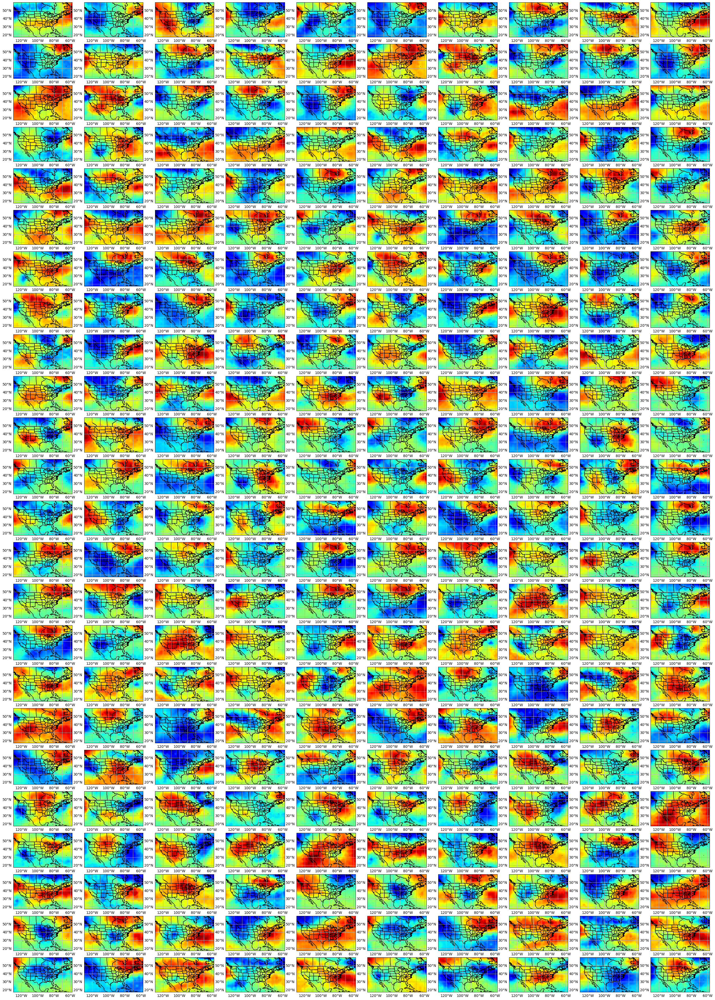

In [13]:
fake_images = toXArray(gen(benchmarkNoise).detach().cpu().squeeze()[:,7:-7,1:-1], hgt.lat, hgt.lon)
my_plot(fake_images, '', proj, data_crs, '', None, True)

In [14]:
fake_images

<xarray.DataArray (n: 256, lat: 18, lon: 30)>
array([[[-0.13176435, -0.15512098, -0.15698451, ...,  0.03721267,
          0.05245395,  0.09563655],
        [-0.21175136, -0.20145608, -0.25009453, ...,  0.03493652,
          0.092996  ,  0.15182215],
        [-0.31798002, -0.2624496 , -0.2628619 , ...,  0.08111548,
          0.10627443,  0.2123111 ],
        ...,
        [-0.15543225, -0.15446715, -0.14685944, ..., -0.15123197,
         -0.17126338, -0.2146738 ],
        [-0.15982515, -0.16576357, -0.1599017 , ..., -0.18345398,
         -0.16497555, -0.19060613],
        [-0.13914058, -0.1464255 , -0.15850222, ..., -0.14778128,
         -0.13247286, -0.17297573]],

       [[-0.09578029, -0.11871138, -0.13649207, ...,  0.04377865,
          0.03612842,  0.0717006 ],
        [-0.05661565, -0.08365645, -0.13367575, ...,  0.05125746,
          0.12375371,  0.12382736],
        [-0.03012745, -0.07886364, -0.09121247, ...,  0.13108096,
          0.16113077,  0.20762433],
...
        [-0.09572568, -0.09390735, -0.10181148, ..., -0.12839924,
         -0.12130596, -0.12891373],
        [-0.10823544, -0.12113991, -0.12276866, ..., -0.15971339,
         -0.16689129, -0.16093832],
        [-0.10252739, -0.12305476, -0.12838829, ..., -0.17629468,
         -0.16479214, -0.16705243]],

       [[-0.11026827, -0.08504527, -0.05784012, ..., -0.29019374,
         -0.2621872 , -0.28138784],
        [-0.10172618, -0.108666  , -0.08569344, ..., -0.20116523,
         -0.21620387, -0.19845706],
        [-0.1436594 , -0.10257204, -0.08948704, ..., -0.13524851,
         -0.12741835, -0.12490174],
        ...,
        [-0.01472395, -0.01708021, -0.0299329 , ..., -0.05568511,
         -0.02666043, -0.06188817],
        [-0.02377382, -0.01978424, -0.02991534, ..., -0.06476165,
         -0.04260504, -0.04988601],
        [-0.02639223, -0.0365971 , -0.04526336, ..., -0.04960657,
         -0.05452673, -0.06597944]]], dtype=float32)
Coordinates:
  * n        (n) int64 0 1 2 3 4 5 6 7 8 ... 247 248 249 250 251 252 253 254 255
  * lat      (lat) float32 60.0 57.5 55.0 52.5 50.0 ... 27.5 25.0 22.5 20.0 17.5
  * lon      (lon) float32 230.0 232.5 235.0 237.5 ... 295.0 297.5 300.0 302.5
Attributes:
    description:  z500
    units:        meters